# Setup (Imports, Parameters)

In [1]:
# Standard Libraries
import os
import random
import pickle
from glob import glob
from pathlib import Path

# Image Processing
import cv2
from PIL import Image
import rasterio
# from patchify import patchify

# Plotting
import matplotlib.pyplot as plt
from matplotlib import pyplot as plt

# Machine Learning and Deep Learning
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.amp import GradScaler, autocast
from torchvision.transforms import Compose, Resize, ToTensor
import albumentations as A
import segmentation_models_pytorch as smp
from segmentation_models_pytorch import Unet
from segmentation_models_pytorch.losses import DiceLoss, SoftBCEWithLogitsLoss, JaccardLoss, FocalLoss
from reben_publication.BigEarthNetv2_0_ImageClassifier import BigEarthNetv2_0_ImageClassifier

# Data Handling
import numpy as np
import lmdb
from safetensors.numpy import load
# import h5py

# Progress Bar
from tqdm import tqdm

# TensorBoard
from torch.utils.tensorboard import SummaryWriter

# Custom Library
import ActivationPrototypes_SARSeg.thesis_utils as utils
from ActivationPrototypes_SARSeg.thesis_utils import *

f:\Thesis\.conda\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-04-16 13:57:36.358 | INFO     | ActivationPrototypes_SARSeg.config:<module>:11 - PROJ_ROOT path is: F:\Thesis\ActivationPrototypes_SARSeg


## Parameters

In [2]:
dataset_lmdb_path = '../data/Encoded-BigEarthNet'
parquet_path = '../data/metadata.parquet'

want_to_train = False # Set this flag to True if you want to train the model

seed=24   # Fix the seed for reproducibility
batch_size= 16
NUM_CLASSES = 20 # 19 classes + 1 unlabeled
n_classes = num_class = NUM_CLASSES

BACKBONE = 'resnet50'
WEIGHTS = None

IMG_HEIGHT = 120
IMG_WIDTH  = 120
IMG_CHANNELS = 2

In [3]:
print(f"CUDA Available: {torch.cuda.is_available()}")
print(f"Device: {torch.cuda.get_device_name(0)}")
print(f"PyTorch Version: {torch.__version__}")
# Check if GPU is available and set the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

CUDA Available: True
Device: NVIDIA GeForce RTX 3080 Ti
PyTorch Version: 2.6.0+cu118
cuda


In [4]:
# Define the transformations
transformx = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
],is_check_shapes=False)

# Parquet file with metadata for Big Earth dataset
train_matches, val_matches, test_matches = match_keys(parquet_path)

print(f"Train size: {len(train_matches)}, Val size: {len(val_matches)}, Test size: {len(test_matches)}")

# Create datasets
train_dataset = SARSegmentationDataset(dataset_lmdb_path, train_matches, transform=transformx)
val_dataset = SARSegmentationDataset(dataset_lmdb_path, val_matches, transform=None)
test_dataset = SARSegmentationDataset(dataset_lmdb_path, test_matches, transform=None)

# Create data loaders
batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

#Define the model metrcis and load model. 
num_train_img = len(train_dataset)
num_val_img = len(val_dataset)
num_test_img = len(test_dataset)

steps_per_epoch = num_train_img//batch_size
val_steps_per_epoch = num_val_img//batch_size
print("Steps per epoch: ", steps_per_epoch)
print("Validation steps per epoch: ", val_steps_per_epoch)


Train size: 237871, Val size: 122342, Test size: 119825
Opening LMDB environment ...
Opening LMDB environment ...
Opening LMDB environment ...
Steps per epoch:  14866
Validation steps per epoch:  7646


### Model initiieren

In [5]:
lmdb_path_experiment_trial = '../data/trial_activations_lmdb'
lmdb_path_experiment_encoder_deocder = '../data/encoder34_decoder_activations_lmdb'
lmdb_path_experiment_flattened = '../data/flattened_activations_lmdb'

use_lmdb_path = lmdb_path_experiment_encoder_deocder

In [6]:
# Load the model checkpoint
model_activations = load_from_checkpoint120("../models/full_120/unet120_full_epoch_19.pth")  # Modify this with your actual model loading function
model_activations.eval()  
model_activations.to(device) 
print("Model loaded successfully!")

Model loaded successfully!


In [7]:
# Print encoder layers
print("Encoder Layers:")
for name, layer in model_activations.encoder.named_children():
    print(f"{name}: {layer}")

# Print decoder layers
print("Decoder Layers:")
for name, layer in model_activations.decoder.named_children():
    print(f"{name}: {layer}")

print("Segmentationb Head:")
for name, layer in model_activations.segmentation_head.named_children():
    print(f"{name}: {layer}")

Encoder Layers:
conv1: Conv2d(2, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
bn1: BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
relu: ReLU(inplace=True)
maxpool: MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
layer1: Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (downsample): Sequential(
      (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): Batch

In [8]:
# Hook function to capture activations
activations_dict = {}

setup_hooks(model_activations, activations_dict)

In [9]:
layer_names = ['encoder.layer3', 'encoder.layer4', 'decoder.up1', 'decoder.up2']

train_image_keys = []
# for match in old_train_matches:
for match in train_matches:
    train_image_key, _ = match
    train_image_keys.append(train_image_key)

trial_keys = train_image_keys[:]

img_size = 120

In [10]:
regions = {
    # First Row
    "A": (0, 0, img_size/4 , img_size/4),
    "B": (img_size/4, 0, img_size/2, img_size/4),
    "C": (img_size/2, 0, 3*img_size/4, img_size/4),
    "D": (3*img_size/4, 0, img_size, img_size/4),
    # Second Row
    "E": (0, img_size/4, img_size/4, img_size/2),
    "F": (img_size/4, img_size/4, img_size/2, img_size/2),
    "G": (img_size/2, img_size/4, 3*img_size/4, img_size/2),
    "H": (3*img_size/4, img_size/4, img_size, img_size/2),
    # Third Row
    "I": (0, img_size/2, img_size/4, 3*img_size/4),
    "J": (img_size/4, img_size/2, img_size/2, 3*img_size/4),
    "K": (img_size/2, img_size/2, 3*img_size/4, 3*img_size/4),
    "L": (3*img_size/4, img_size/2, img_size, 3*img_size/4),
    # Fourth Row
    "M": (0, 3*img_size/4, img_size/4, img_size),
    "N": (img_size/4, 3*img_size/4, img_size/2, img_size),
    "O": (img_size/2, 3*img_size/4, 3*img_size/4, img_size),
    "P": (3*img_size/4, 3*img_size/4, img_size, img_size),
}

print(regions)

# Plot a grid of regions according to their coordinates

{'A': (0, 0, 30.0, 30.0), 'B': (30.0, 0, 60.0, 30.0), 'C': (60.0, 0, 90.0, 30.0), 'D': (90.0, 0, 120, 30.0), 'E': (0, 30.0, 30.0, 60.0), 'F': (30.0, 30.0, 60.0, 60.0), 'G': (60.0, 30.0, 90.0, 60.0), 'H': (90.0, 30.0, 120, 60.0), 'I': (0, 60.0, 30.0, 90.0), 'J': (30.0, 60.0, 60.0, 90.0), 'K': (60.0, 60.0, 90.0, 90.0), 'L': (90.0, 60.0, 120, 90.0), 'M': (0, 90.0, 30.0, 120), 'N': (30.0, 90.0, 60.0, 120), 'O': (60.0, 90.0, 90.0, 120), 'P': (90.0, 90.0, 120, 120)}


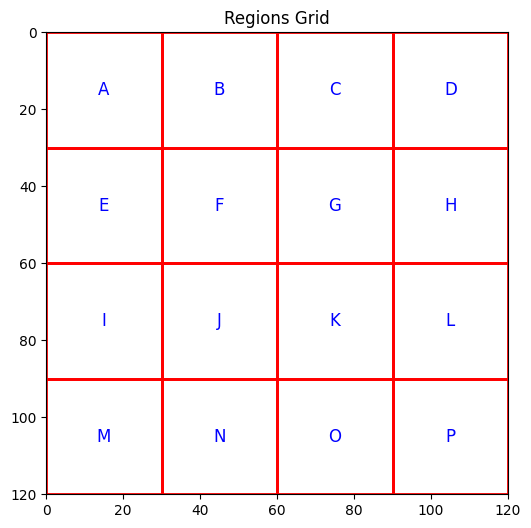

In [11]:
fig, ax = plt.subplots(figsize=(6,6))

for label, (x1, y1, x2, y2) in regions.items():
    w = x2 - x1
    h = y2 - y1
    rect = patches.Rectangle((x1, y1), w, h, 
                             fill=False, edgecolor='red', linewidth=2)
    ax.add_patch(rect)
    ax.text(x1 + w/2, y1 + h/2, label, 
            ha='center', va='center', fontsize=12,
            color='blue')

ax.set_xlim([0, img_size])
ax.set_ylim([0, img_size])
ax.set_aspect('equal')
ax.invert_yaxis()
plt.title("Regions Grid")
plt.show()
# Plot a grid of regions according to their coordinates


In [12]:
regions_match_via_iou((88,0,120,32),(90,0,120,30),0.6)

0.87890625


True

In [13]:
random.seed(42)
train_matches_subsample = random.sample(train_matches, len(train_matches)//10)
lmdb_path_subsampel = '../data/subsampled_activations_lmdb'

subsample_image_keys = []
# for match in old_train_matches:
for match in train_matches_subsample:
    train_image_key, _ = match
    subsample_image_keys.append(train_image_key)

print(train_matches_subsample[:5])

[('S1A_IW_GRDH_1SDV_20180126T161302_34VDN_15_88', 'S2B_MSIL2A_20180127T102259_N9999_R065_T34VDN_15_88_reference_map'), ('S1A_IW_GRDH_1SDV_20170903T153258_35VNL_70_4', 'S2A_MSIL2A_20170905T095031_N9999_R079_T35VNL_70_04_reference_map'), ('S1A_IW_GRDH_1SDV_20170617T064659_29UPU_62_3', 'S2A_MSIL2A_20170617T113321_N9999_R080_T29UPU_62_03_reference_map'), ('S1A_IW_GRDH_1SDV_20180420T063917_29UPU_27_80', 'S2B_MSIL2A_20180421T114349_N9999_R123_T29UPU_27_80_reference_map'), ('S1A_IW_GRDH_1SDV_20180413T161957_34UEG_40_3', 'S2A_MSIL2A_20180413T095031_N9999_R079_T34UEG_40_03_reference_map')]


# Experimente

## Randomized Approach with multiple Images

### Parallelization

In [14]:
# Iterate over random subset of test images, and find similar images, store in dataframe
random.seed(42)
amount = 8
test_image_keys = random.sample(test_matches, amount)
test_image_refs = []
for (test_image_key, _) in test_image_keys:
    test_image_refs.append(test_image_key)

#randomly select 'amount' values from "regions" dictionary
region_list = random.choices(list(regions.values()), k=amount)
print(region_list)
print(test_image_refs)
print(subsample_image_keys)

[(90.0, 60.0, 120, 90.0), (60.0, 60.0, 90.0, 90.0), (60.0, 90.0, 90.0, 120), (30.0, 0, 60.0, 30.0), (60.0, 30.0, 90.0, 60.0), (0, 0, 30.0, 30.0), (90.0, 0, 120, 30.0), (0, 60.0, 30.0, 90.0)]
['S1B_IW_GRDH_1SDV_20171220T050937_33TWN_38_61', 'S1A_IW_GRDH_1SDV_20170812T182647_29SNC_59_67', 'S1A_IW_GRDH_1SDV_20170617T064724_29UPU_29_27', 'S1A_IW_GRDH_1SDV_20180420T063917_29UPU_35_65', 'S1A_IW_GRDH_1SDV_20180202T044945_35VLJ_39_31', 'S1A_IW_GRDH_1SDV_20171203T183450_29SNB_68_39', 'S1B_IW_GRDH_1SDV_20171121T064205_29SND_52_43', 'S1A_IW_GRDH_1SDV_20170903T153258_35VNL_50_46']
['S1A_IW_GRDH_1SDV_20180126T161302_34VDN_15_88', 'S1A_IW_GRDH_1SDV_20170903T153258_35VNL_70_4', 'S1A_IW_GRDH_1SDV_20170617T064659_29UPU_62_3', 'S1A_IW_GRDH_1SDV_20180420T063917_29UPU_27_80', 'S1A_IW_GRDH_1SDV_20180413T161957_34UEG_40_3', 'S1B_IW_GRDH_1SDV_20171222T063355_29SND_85_47', 'S1A_IW_GRDH_1SDV_20171207T162450_34TEN_20_12', 'S1A_IW_GRDH_1SDV_20171004T183450_29SNB_54_5', 'S1A_IW_GRDH_1SDV_20180420T063917_29UPU_2_3

In [15]:
temp_res = {}
for (ref, mask_key), region in zip(test_image_keys, region_list):
    print(f"Image Key: {ref}")
    img, mask = get_image_and_mask_from_key(ref, lmdb_path = dataset_lmdb_path)
    print(f"Shape of image: {img.shape}")
    res = find_n_similar_images(
                                        img, 
                                        layer_names, 
                                        subsample_image_keys[:500], 
                                        lmdb_path_subsampel, 
                                        dataset_lmdb_path, 
                                        model_activations, 
                                        img_hw = (img_size,img_size), 
                                        region_coords=region, 
                                        plotting = False)
    temp_res[ref] = res

print(temp_res)

Image Key: S1B_IW_GRDH_1SDV_20171220T050937_33TWN_38_61
Shape of image: (2, 120, 120)


f:\Thesis\.conda\lib\site-packages\torch\nn\modules\module.py:1739: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)
F:\Thesis\ActivationPrototypes_SARSeg\ActivationPrototypes_SARSeg\thesis_utils.py:1049: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\torch\csrc\utils\tensor_numpy.cpp:209.)
  activation_tensor = torch.from_numpy(activation_array).reshape(LAYER_SHAPES[layer_name])


Image Key: S1A_IW_GRDH_1SDV_20170812T182647_29SNC_59_67
Shape of image: (2, 120, 120)
Image Key: S1A_IW_GRDH_1SDV_20170617T064724_29UPU_29_27
Shape of image: (2, 120, 120)
Image Key: S1A_IW_GRDH_1SDV_20180420T063917_29UPU_35_65
Shape of image: (2, 120, 120)
Image Key: S1A_IW_GRDH_1SDV_20180202T044945_35VLJ_39_31
Shape of image: (2, 120, 120)
Image Key: S1A_IW_GRDH_1SDV_20171203T183450_29SNB_68_39
Shape of image: (2, 120, 120)
Image Key: S1B_IW_GRDH_1SDV_20171121T064205_29SND_52_43
Shape of image: (2, 120, 120)
Image Key: S1A_IW_GRDH_1SDV_20170903T153258_35VNL_50_46
Shape of image: (2, 120, 120)
{'S1B_IW_GRDH_1SDV_20171220T050937_33TWN_38_61': [[(0.6632487177848816, 'S1B_IW_GRDH_1SDV_20171220T050937_33TWN_34_87', (30, 30, 60, 60)), (0.6143645644187927, 'S1A_IW_GRDH_1SDV_20180421T165111_33UWQ_2_75', (30, 90, 60, 120)), (0.6101443767547607, 'S1B_IW_GRDH_1SDV_20171220T050912_33TWN_89_50', (90, 30, 120, 60)), (0.6050046682357788, 'S1B_IW_GRDH_1SDV_20171220T050937_33TWN_34_87', (60, 0, 90, 3

In [16]:
import subprocess
import json

params = {
    "test_image_keys": test_image_refs,
    "region_list": region_list,
    "layer_names": layer_names,
    "subsample_image_keys": subsample_image_keys,
    "lmdb_path_subsampel": str(lmdb_path_subsampel),
    "dataset_lmdb_path": str(dataset_lmdb_path),
    "model_activations_path": "../models/full_120/unet120_full_epoch_19.pth",
    "img_size": str(img_size),
    "max_workers": "8",
    "output_file": "similarity_results.pkl"
}

with open("params_temp.json", "w") as f:
    json.dump(params, f)

subprocess.run(["python", "find_similars.py", "--params_file", "params_temp.json"])


CompletedProcess(args=['python', 'find_similars.py', '--params_file', 'params_temp.json'], returncode=0)

In [20]:
import os
import pickle

file_path = "similarity_results.pkl"
if os.path.exists(file_path):
    print("File exists.")
    if os.path.getsize(file_path) == 0:
        print("File is empty.")
    else:
        print("File is not empty.")
        with open(file_path, "rb") as f:
            similar_images = pickle.load(f)
            print("Loaded pickle with", len(similar_images), "entries.")
else:
    print("File is empty or does not exist.")

File exists.
File is not empty.
Loaded pickle with 8 entries.


In [21]:
print(similar_images)

{'S1B_IW_GRDH_1SDV_20171220T050937_33TWN_38_61': [[(0.6632487177848816, 'S1B_IW_GRDH_1SDV_20171220T050937_33TWN_34_87', (30, 30, 60, 60)), (0.6143645644187927, 'S1A_IW_GRDH_1SDV_20180421T165111_33UWQ_2_75', (30, 90, 60, 120)), (0.6101443767547607, 'S1B_IW_GRDH_1SDV_20171220T050912_33TWN_89_50', (90, 30, 120, 60)), (0.6050046682357788, 'S1B_IW_GRDH_1SDV_20171220T050937_33TWN_34_87', (60, 0, 90, 30)), (0.6022535562515259, 'S1B_IW_GRDH_1SDV_20171220T050937_33TWN_34_87', (90, 60, 120, 90)), (0.5993598699569702, 'S1B_IW_GRDH_1SDV_20171220T050937_33TWN_34_87', (90, 0, 120, 30)), (0.5978725552558899, 'S1B_IW_GRDH_1SDV_20171220T050912_33TWN_89_50', (30, 90, 60, 120)), (0.5943566560745239, 'S1A_IW_GRDH_1SDV_20180225T055027_31UER_80_47', (0, 60, 30, 90)), (0.5927694439888, 'S1B_IW_GRDH_1SDV_20171220T050937_33TWN_71_85', (90, 60, 120, 90)), (0.5853868126869202, 'S1B_IW_GRDH_1SDV_20171220T050937_33TWN_34_87', (60, 30, 90, 60)), (0.5834934115409851, 'S1B_IW_GRDH_1SDV_20180524T042416_35VPJ_60_1', (0

In [22]:
with open("find_similars_log.txt") as log_file:
    log_content = log_file.read()

print(log_content)


2025-04-16 13:58:52,230 [INFO] Processing S1A_IW_GRDH_1SDV_20170903T153258_35VNL_50_46
2025-04-16 13:59:22,620 [INFO] Finished S1A_IW_GRD2025-04-16 13:59:24,044 [INFO] Finished all. Saving results to similarity_results.pkl
2025-04-16 13:59:24,045 [INFO] Done.



In [23]:
# print the results
print(temp_res == similar_images)

True


## Qualitative

### For each class, scrutinize an example

### Multiple Classes on Original Image (n = 1 , n = 2, n = 3 -> examples)

# Thoughts and Trial

```
Stage	            Layer Type	                    Downsampling Factor
Input	            -	                            1× (Original size: 120×120)
Conv1	            7×7 Conv + Stride 2	            2× (Now: 60×60)
MaxPool	            3×3 Pool + Stride 2	            4× (Now: 30×30)
ResNet Block 1	    Convolutions	            4× (30×30)
ResNet Block 2	    Convolutions + Stride 2	    8× (Now: 15×15)
ResNet Block 3	    Convolutions + Stride 2	    15× (Now: 8×8)
ResNet Block 4	    Convolutions + Stride 2	    30× (Now: 4×4)
```

At the deepest layer (ResNet Block 4), the spatial resolution is reduced by a factor of 32.

This means for a 120×120 input, the output feature map at the deepest encoder layer is about (120/32) = 3.75, which is NOT an integer.

UNet’s decoder expects clean integer feature map sizes, so it forces an input size that is a multiple of 32.

Fix ideas:
1) Modify Encoder to avoid odd sizes
2) Manually Pad Encoder Output
3) Have a flexible Decoder that can handle odd sizes
4) use a different encoder that supports sizes natively and retrain from scratch without pretrained weights

# Experiment with FAISS KNN

In [27]:
ref_to_test = 'S1B_IW_GRDH_1SDV_20180517T154802_35VNJ_55_62'

In [59]:
import faiss 
SCALE_FACTORS = {
    'encoder.layer1': 4, 'encoder.layer2': 8, 'encoder.layer3': 15, 'encoder.layer4': 30,
    'decoder.up1': 15, 'decoder.up2': 8, 'decoder.up3': 4, 'decoder.up4': 2, 'decoder.up5': 1
}

def build_faiss_index(train_image_keys, layer_names, activation_lmdb_path, divisions):
    """
    Build a FAISS index from candidate region features extracted via sliding window.
    
    Args:
        train_image_keys (List[str]): List of training image keys.
        layer_name (str): Name of the activation layer.
        activation_lmdb_path (str): Path to the LMDB storing activations.
        win_w (int): Width of the sliding window.
        win_h (int): Height of the sliding window.
        factor (int): Scale factor for converting activation coordinates.
    
    Returns:
        index: FAISS index built on candidate features.
        metadata: List of tuples (image_key, region_coords) corresponding to each feature.
    """
    # List to store all candidate features and metadata
    candidate_features = []
    metadata = []
    
    env = lmdb.open(activation_lmdb_path, readonly=True, lock=False)
    with env.begin() as txn:
        for layer in layer_names:
            print(f"Processing layer: {layer}")
            # Find parameters for current layer
            example_key = train_image_keys[0]
            example_activation = load_activation(example_key, layer, env=env)
            example_tensor = example_activation.to(device)
            _, _ , H, W = example_tensor.shape
            
            print(f"Example tensor shape: {example_tensor.shape}")

            factor = SCALE_FACTORS[layer]
            win_w = win_h = H//divisions
            print(f"Layer: {layer}, Factor: {factor}, Patchsize: {win_w}x{win_h}")

            for image_key in train_image_keys:
                train_activation = load_activation(image_key, layer, env=env)
                if train_activation is None:
                    continue
                train_tensor = train_activation.to(device)

                # Compute positions (adjust as needed if your sliding window should cover the whole map)
                x_positions = list(range(0, W, win_w))
                y_positions = list(range(0, H, win_h))
                
                for y in y_positions:
                    for x in x_positions:
                        candidate_region = train_tensor[:, :, y:y+win_h, x:x+win_w]
                        # Flatten candidate region activation
                        candidate_flat = candidate_region.flatten(start_dim=1)
                        # Convert to numpy array (assuming single batch)
                        feature = candidate_flat.squeeze(0).cpu().numpy().astype('float32')
                        candidate_features.append(feature)
                        # Store corresponding metadata: scale region back to image space
                        region = (x * factor, y * factor, (x + win_w) * factor, (y + win_h) * factor)
                        metadata.append((image_key, region, layer))
        
    env.close()
    
    for i, feat in enumerate(candidate_features):
        print(f"Feature {i} shape: {feat.shape}")

    candidate_features = np.vstack(candidate_features)  # Shape: (num_candidates, feature_dim)
    d = candidate_features.shape[1]
    
    # Create a FAISS index with L2 distance (you can change to inner product for cosine if normalized)
    index = faiss.IndexFlatL2(d)
    index.add(candidate_features)
    
    return index, metadata

def query_faiss_index(index, query_activation, region_coords, layer_name, n=5):
    """
    Query the FAISS index with the flattened query region feature.
    
    Args:
        index: FAISS index.
        query_activation (torch.Tensor): The full activation of the query image.
        region_coords (Tuple[int,int,int,int]): Coordinates to extract the query region.
        layer_name (str): Layer name (used if you need layer-specific processing).
        n (int): Number of neighbors to retrieve.
        
    Returns:
        distances: FAISS distances.
        indices: Indices of the retrieved candidate features.
    """
    # Assume you have a function to extract the query region as you did in your original code:
    query_tensor = query_activation.to(device)
    if region_coords:
        query_tensor = extract_region_activations(query_tensor, region_coords, layer_name)
    
    # Flatten the query region (assume batch size is 1)
    query_flat = query_tensor.flatten(start_dim=1).squeeze(0)
    # Convert to numpy array
    query_np = query_flat.cpu().numpy().astype('float32')
    # Reshape as (1, d)
    query_np = np.expand_dims(query_np, axis=0)
    
    distances, indices = index.search(query_np, n)
    return distances[0], indices[0]

def find_n_similar_regions_faiss(query_activation, layer_name, train_image_keys, activation_lmdb_path, index, matadata,
                                 n=5, region_coords=None, metric='cosine'):
    """
    Find top-N similar regions using a prebuilt FAISS index.
    
    Args:
        query_activation (torch.Tensor): Feature activation for the query image.
        layer_name (str): Model layer name.
        train_image_keys (List[str]): List of training image keys.
        activation_lmdb_path (str): LMDB path for activations.
        n (int): Number of top similar regions.
        region_coords (Tuple[int,int,int,int]): Coordinates of query region.
        win_w, win_h (int): Dimensions of sliding window (extracted from query activation shape).
        factor (int): Scale factor for region coordinates.
        metric (str): Similarity metric (for FAISS, using L2 here).
    
    Returns:
        List[Tuple[float, str, Tuple[int,int,int,int]]]: Sorted list of (similarity, image_key, region_coords).
    """
    
    # Query the index with the query region feature
    distances, indices = query_faiss_index(index, query_activation, region_coords, layer_name, n=n)
    
    # Prepare results: here lower L2 distances mean higher similarity.
    results = []
    for d, idx in zip(distances, indices):
        image_key, region = metadata[idx]
        # For cosine similarity, you might need to convert or normalize your features;
        # here we simply return the L2 distance as a similarity score.
        results.append((d, image_key, region))
    
    # Sort results if needed (lower distance = better match)
    results = sorted(results, key=lambda x: x[0])
    return results


In [49]:
np.ceil(120/8)

15.0

In [61]:
index_4x4, metadata_4x4 = build_faiss_index(image_keys, ["decoder.up1"], lmdb_path_subsampel, divisions = 2)

Processing layer: decoder.up1
Example tensor shape: torch.Size([1, 256, 8, 8])
Layer: decoder.up1, Factor: 15, Patchsize: 4x4
Feature 0 shape: (4096,)
Feature 1 shape: (4096,)
Feature 2 shape: (4096,)
Feature 3 shape: (4096,)
Feature 4 shape: (4096,)
Feature 5 shape: (4096,)
Feature 6 shape: (4096,)
Feature 7 shape: (4096,)
Feature 8 shape: (4096,)
Feature 9 shape: (4096,)
Feature 10 shape: (4096,)
Feature 11 shape: (4096,)
Feature 12 shape: (4096,)
Feature 13 shape: (4096,)
Feature 14 shape: (4096,)
Feature 15 shape: (4096,)
Feature 16 shape: (4096,)
Feature 17 shape: (4096,)
Feature 18 shape: (4096,)
Feature 19 shape: (4096,)
Feature 20 shape: (4096,)
Feature 21 shape: (4096,)
Feature 22 shape: (4096,)
Feature 23 shape: (4096,)
Feature 24 shape: (4096,)
Feature 25 shape: (4096,)
Feature 26 shape: (4096,)
Feature 27 shape: (4096,)
Feature 28 shape: (4096,)
Feature 29 shape: (4096,)
Feature 30 shape: (4096,)
Feature 31 shape: (4096,)
Feature 32 shape: (4096,)
Feature 33 shape: (4096,)


In [60]:
index_4x4, metadata_4x4 = build_faiss_index(image_keys, ["decoder.up2"], lmdb_path_subsampel, divisions = 2)
#index_2x2, metadata_2x2 = build_faiss_index(image_keys, layer_names, lmdb_path_subsampelm, divisions = 2)

Processing layer: decoder.up2
Example tensor shape: torch.Size([1, 128, 15, 15])
Layer: decoder.up2, Factor: 8, Patchsize: 7x7
Feature 0 shape: (6272,)
Feature 1 shape: (6272,)
Feature 2 shape: (896,)
Feature 3 shape: (6272,)
Feature 4 shape: (6272,)
Feature 5 shape: (896,)
Feature 6 shape: (896,)
Feature 7 shape: (896,)
Feature 8 shape: (128,)
Feature 9 shape: (6272,)
Feature 10 shape: (6272,)
Feature 11 shape: (896,)
Feature 12 shape: (6272,)
Feature 13 shape: (6272,)
Feature 14 shape: (896,)
Feature 15 shape: (896,)
Feature 16 shape: (896,)
Feature 17 shape: (128,)
Feature 18 shape: (6272,)
Feature 19 shape: (6272,)
Feature 20 shape: (896,)
Feature 21 shape: (6272,)
Feature 22 shape: (6272,)
Feature 23 shape: (896,)
Feature 24 shape: (896,)
Feature 25 shape: (896,)
Feature 26 shape: (128,)
Feature 27 shape: (6272,)
Feature 28 shape: (6272,)
Feature 29 shape: (896,)
Feature 30 shape: (6272,)
Feature 31 shape: (6272,)
Feature 32 shape: (896,)
Feature 33 shape: (896,)
Feature 34 shape:

ValueError: all the input array dimensions except for the concatenation axis must match exactly, but along dimension 1, the array at index 0 has size 6272 and the array at index 2 has size 896

In [57]:
print("4x4 Index: ", index_4x4.ntotal)
#print("2x2 Index: ", index_2x2.ntotal)

print("4x4 Metadata: ", len(metadata_4x4))
#print("2x2 Metadata: ", len(metadata_2x2))

print("4x4 Metadata: ", metadata_4x4[:5])
#print("2x2 Metadata: ", metadata_2x2[:5])

4x4 Index:  380592
4x4 Metadata:  380592
4x4 Metadata:  [('S1A_IW_GRDH_1SDV_20180126T161302_34VDN_15_88', (0, 0, 30, 30), 'decoder.up1'), ('S1A_IW_GRDH_1SDV_20180126T161302_34VDN_15_88', (30, 0, 60, 30), 'decoder.up1'), ('S1A_IW_GRDH_1SDV_20180126T161302_34VDN_15_88', (60, 0, 90, 30), 'decoder.up1'), ('S1A_IW_GRDH_1SDV_20180126T161302_34VDN_15_88', (90, 0, 120, 30), 'decoder.up1'), ('S1A_IW_GRDH_1SDV_20180126T161302_34VDN_15_88', (0, 30, 30, 60), 'decoder.up1')]


In [45]:
query_image_reference = 'S1B_IW_GRDH_1SDV_20180517T154802_35VNJ_55_62'  #image from test split
query_mask_reference = 'S2B_MSIL2A_20180515T094029_N9999_R036_T35VNJ_55_62_reference_map'

test_img, test_mask = get_image_and_mask_from_key(query_image_reference, lmdb_path = dataset_lmdb_path)

activations_d = {}
setup_hooks(model_activations, activations_d)

model_activations.eval()
with torch.no_grad():
    query_activation = inference(torch.tensor(test_img).unsqueeze(0), model_activations)

query_activation = activations_d["encoder.layer3"]
print(query_activation.shape)

# Query FAISS index to retrieve top-n matches
top_n_matches = find_n_similar_regions_faiss(
    query_activation,
    layer_name="encoder.layer3",
    train_image_keys=image_keys,
    activation_lmdb_path=lmdb_path_subsampel,
    n=5,  # top 5 matches
    region_coords=regions["A"],  # use region "A" from your regions dictionary
    win_w=win_w,
    win_h=win_h,
    factor=factor,
    metric='cosine'  # if using cosine, ensure features are normalized
)

torch.Size([1, 1024, 8, 8])


f:\Thesis\.conda\lib\site-packages\torch\nn\modules\module.py:1739: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


NameError: name 'win_w' is not defined

In [52]:
print("Top Left")
top_n_topleft = find_n_similar_images(test_img, "decoder.up2", image_keys, lmdb_path_subsampel, dataset_lmdb_path, model_activations, img_hw = (img_size,img_size), region_coords=regions["A"], plotting = False)

Top Left
query_tensor: torch.Size([1, 128, 3, 3]), win_w: 3, win_h: 3, acti_w: 15, acti_h: 15


KeyboardInterrupt: 